In [1]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 35.9 MB/s eta 0:00:0000:01
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114248 sha256=6d026fa92e61770aa74f6f3c7e33ce00c4ec2aad294a6663ce6b94941bde99bc
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


In [7]:
!apt-get install ffmpeg

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 68 not upgraded.


In [3]:
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

24-11-23 10:46:22 - Directory /root/.deepface has been created
24-11-23 10:46:22 - Directory /root/.deepface/weights has been created


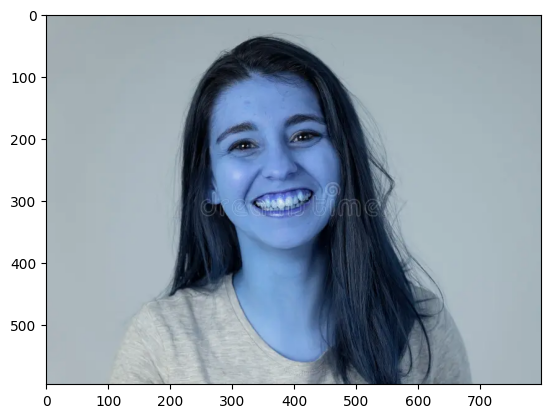

24-11-23 10:46:24 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /root/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 79.2MB/s]


[{'emotion': {'angry': 3.4902753597776994e-15, 'disgust': 3.4545987043317054e-25, 'fear': 5.7426054496983385e-15, 'happy': 99.93219375610352, 'sad': 3.806195809918922e-10, 'surprise': 3.9846980826041545e-05, 'neutral': 0.06776978843845427}, 'dominant_emotion': 'happy', 'region': {'x': 231, 'y': 101, 'w': 265, 'h': 265, 'left_eye': (412, 200), 'right_eye': (314, 214)}, 'face_confidence': 0.9}]
happy


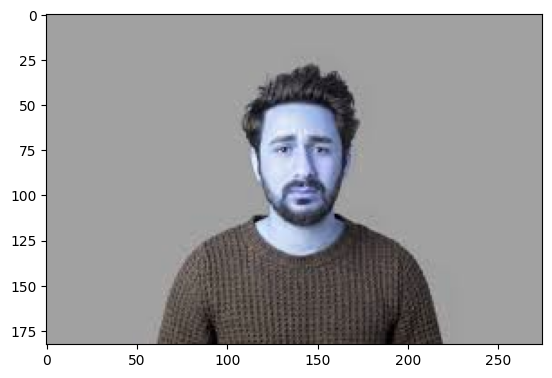

[{'emotion': {'angry': 0.512947360372858, 'disgust': 6.531563133325978e-06, 'fear': 0.051301798954019075, 'happy': 0.008078956799249658, 'sad': 1.7356252091377724, 'surprise': 0.0015907360570954947, 'neutral': 97.690445460028}, 'dominant_emotion': 'neutral', 'region': {'x': 110, 'y': 49, 'w': 65, 'h': 65, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89}]
neutral


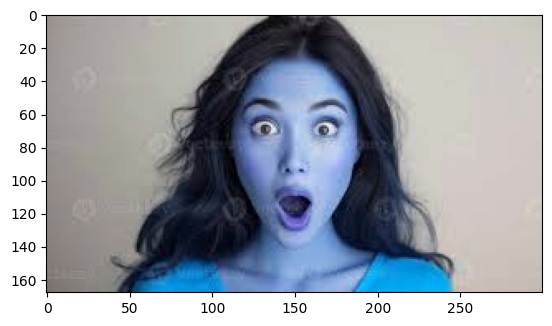

[{'emotion': {'angry': 2.606747226922904e-13, 'disgust': 5.2784920393299815e-25, 'fear': 5.969941341842128e-06, 'happy': 3.7462934566097734e-12, 'sad': 2.3139991233150742e-14, 'surprise': 99.99999403953517, 'neutral': 8.940082967225495e-19}, 'dominant_emotion': 'surprise', 'region': {'x': 105, 'y': 31, 'w': 93, 'h': 93, 'left_eye': (169, 68), 'right_eye': (131, 68)}, 'face_confidence': 0.93}]
surprise


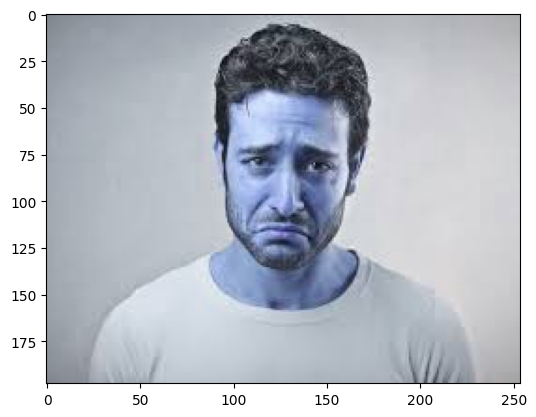

[{'emotion': {'angry': 10.17404110276944, 'disgust': 0.050220973290635545, 'fear': 4.399027565063689, 'happy': 0.004592192909471082, 'sad': 75.56012723208232, 'surprise': 0.034692614893733854, 'neutral': 9.777303622800328}, 'dominant_emotion': 'sad', 'region': {'x': 86, 'y': 47, 'w': 87, 'h': 87, 'left_eye': (141, 82), 'right_eye': (114, 79)}, 'face_confidence': 0.91}]
sad


In [4]:
img1_path = '/kaggle/input/emotion/happy.jpeg'
img2_path = '/kaggle/input/emotion/sad.jpeg'
img4_path = '/kaggle/input/emotion/sad2.jpeg'
img3_path='/kaggle/input/emotion/suprised.jpeg'
dir=[img1_path,img2_path,img3_path,img4_path]
for i in dir:
      img = cv2.imread(i)
      plt.imshow(img)
      plt.show()
      results = DeepFace.analyze(i, actions = ['emotion'])
      print(results)
      for result in results:
          print(result['dominant_emotion'])

#Face box Testing

In [5]:
faceMark=cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')

In [6]:
font=cv2.FONT_HERSHEY_SIMPLEX
def facemark1(img_path):
  img1 = cv2.imread(img_path) # Read the image data into a NumPy array called img1
  gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) # Pass the NumPy array to cvtColor
  faces = faceMark.detectMultiScale(gray, 1.1, 4)
  for (x, y, w, h) in faces:
      cv2.rectangle(img1, (x, y), (x + w, y + h), (255, 0, 0), 2) # Draw rectangle on img1
      cv2.putText(img1,results[0]['dominant_emotion'],(50,50),font,1,(255,0,0),2,cv2.LINE_4)
  plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)) # Display the modified img1
  plt.show()

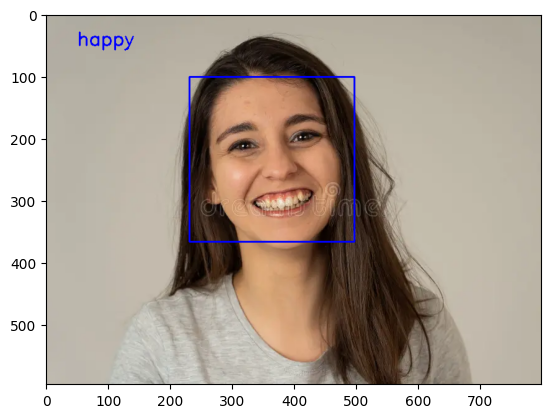

[{'emotion': {'angry': 3.4902753597776994e-15, 'disgust': 3.4545987043317054e-25, 'fear': 5.7426054496983385e-15, 'happy': 99.93219375610352, 'sad': 3.806195809918922e-10, 'surprise': 3.9846980826041545e-05, 'neutral': 0.06776978843845427}, 'dominant_emotion': 'happy', 'region': {'x': 231, 'y': 101, 'w': 265, 'h': 265, 'left_eye': (412, 200), 'right_eye': (314, 214)}, 'face_confidence': 0.9}]
happy


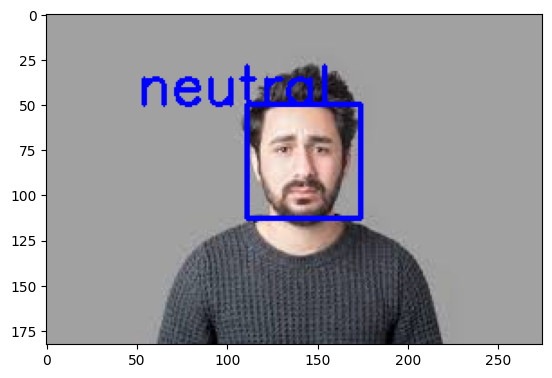

[{'emotion': {'angry': 0.512947360372858, 'disgust': 6.531563133325978e-06, 'fear': 0.051301798954019075, 'happy': 0.008078956799249658, 'sad': 1.7356252091377724, 'surprise': 0.0015907360570954947, 'neutral': 97.690445460028}, 'dominant_emotion': 'neutral', 'region': {'x': 110, 'y': 49, 'w': 65, 'h': 65, 'left_eye': None, 'right_eye': None}, 'face_confidence': 0.89}]
neutral


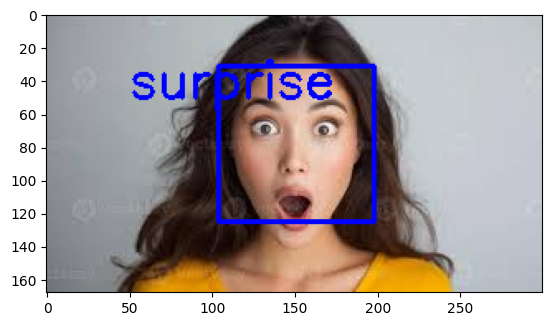

[{'emotion': {'angry': 2.606747226922904e-13, 'disgust': 5.2784920393299815e-25, 'fear': 5.969941341842128e-06, 'happy': 3.7462934566097734e-12, 'sad': 2.3139991233150742e-14, 'surprise': 99.99999403953517, 'neutral': 8.940082967225495e-19}, 'dominant_emotion': 'surprise', 'region': {'x': 105, 'y': 31, 'w': 93, 'h': 93, 'left_eye': (169, 68), 'right_eye': (131, 68)}, 'face_confidence': 0.93}]
surprise


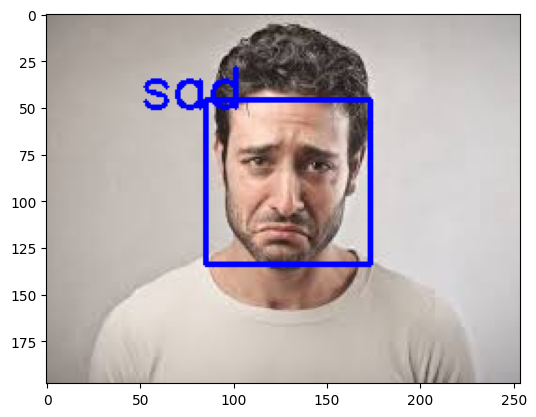

[{'emotion': {'angry': 10.17404110276944, 'disgust': 0.050220973290635545, 'fear': 4.399027565063689, 'happy': 0.004592192909471082, 'sad': 75.56012723208232, 'surprise': 0.034692614893733854, 'neutral': 9.777303622800328}, 'dominant_emotion': 'sad', 'region': {'x': 86, 'y': 47, 'w': 87, 'h': 87, 'left_eye': (141, 82), 'right_eye': (114, 79)}, 'face_confidence': 0.91}]
sad


In [7]:
for i in dir:
  results = DeepFace.analyze(i, actions = ['emotion'])
  facemark1(i)
  print(results)
  print(results[0]['dominant_emotion'])

# Take A recorded Video Which hass An Audio
# and put that path in video_path variable

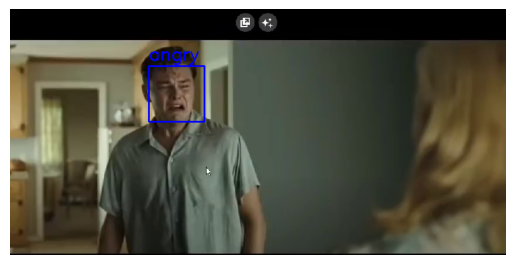

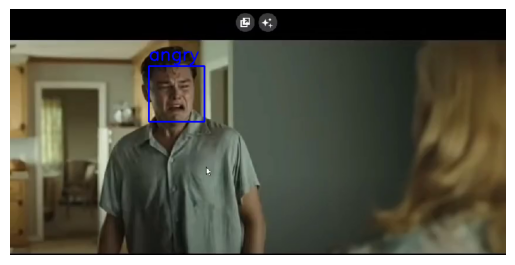

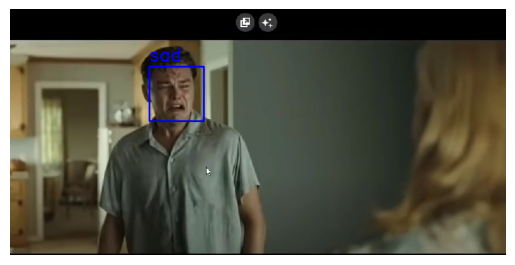

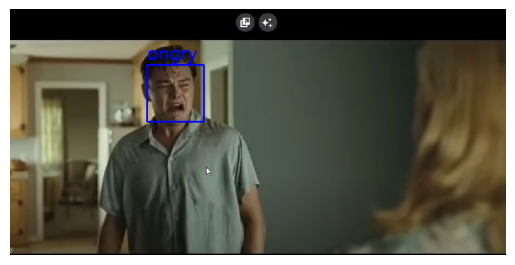

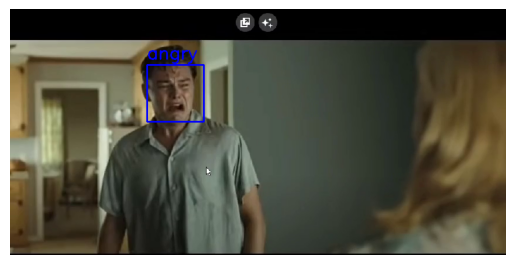

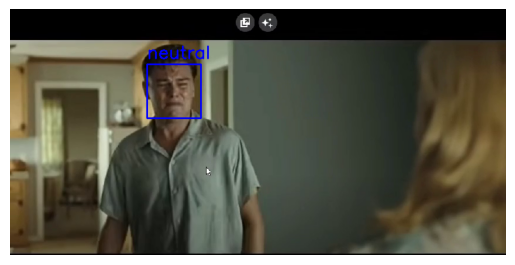

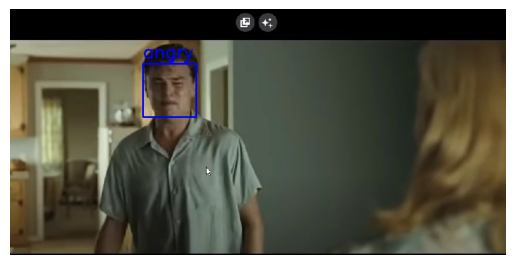

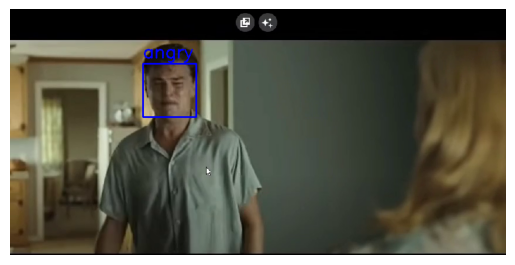

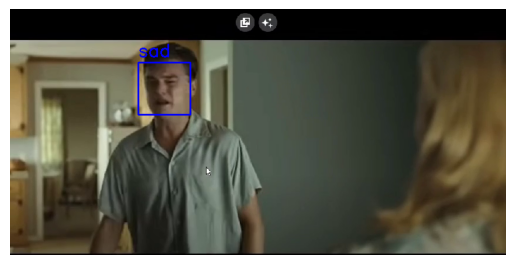

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


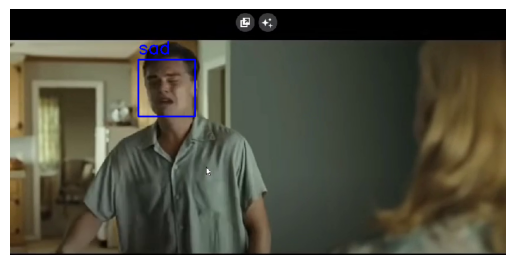

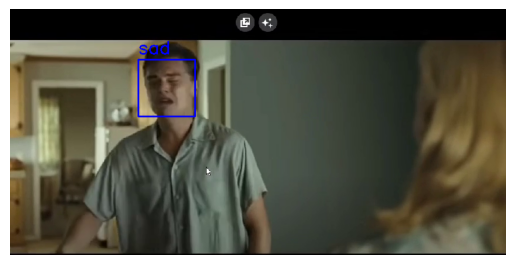

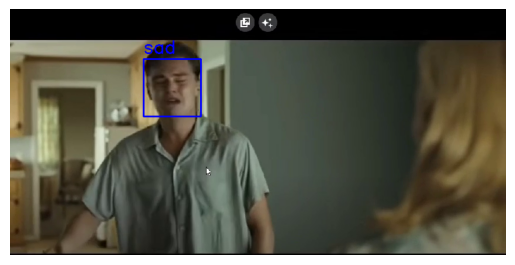

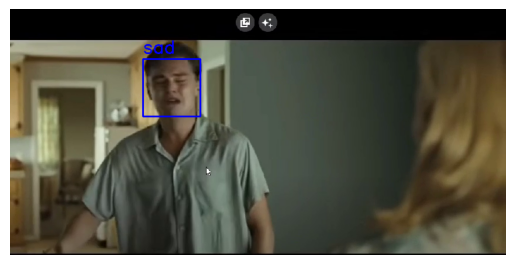

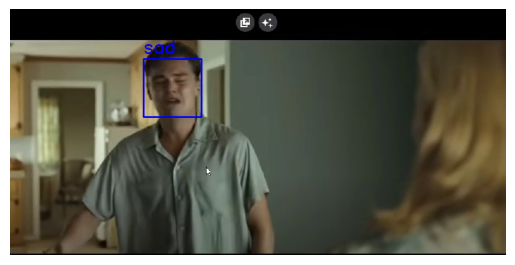

...

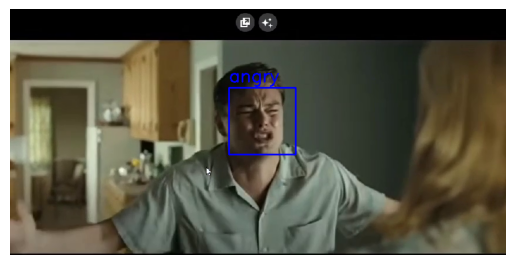

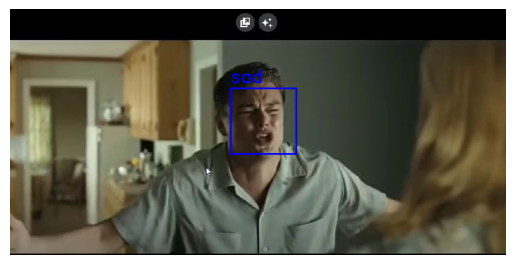

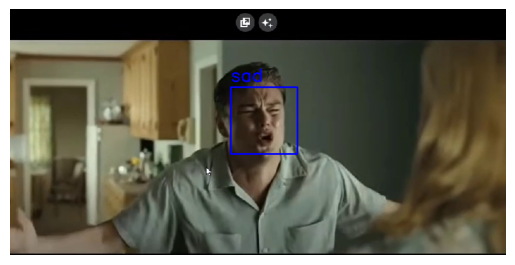

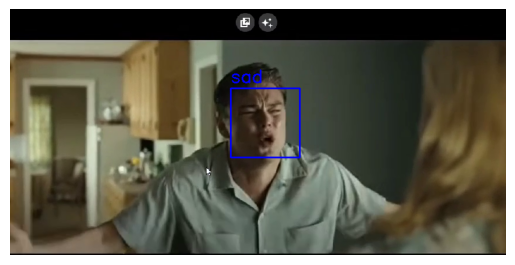

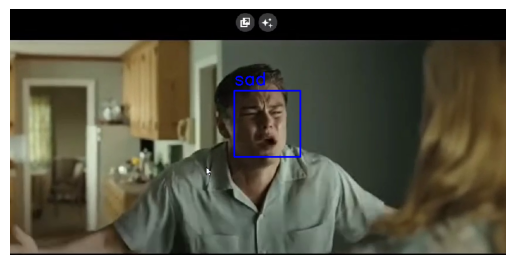

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


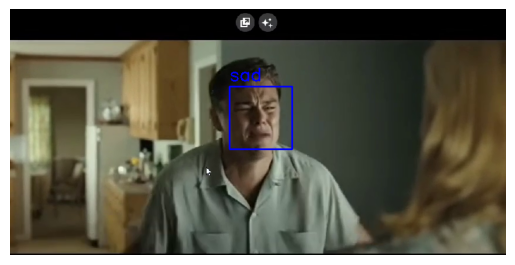

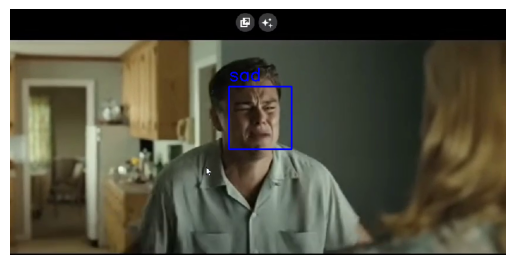

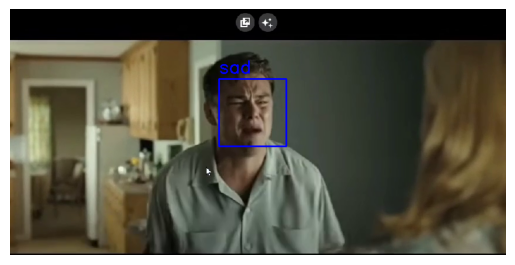

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in 

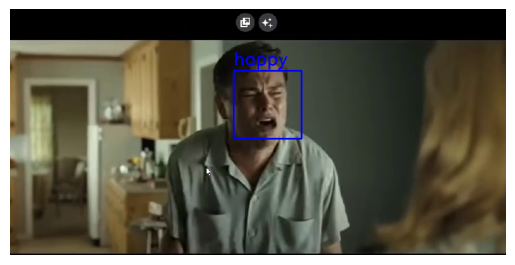

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


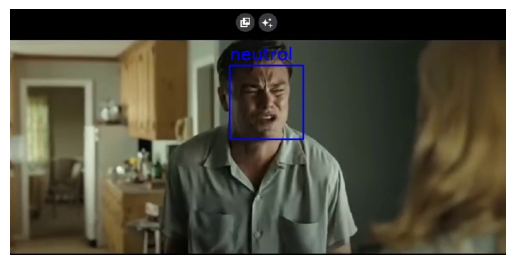

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


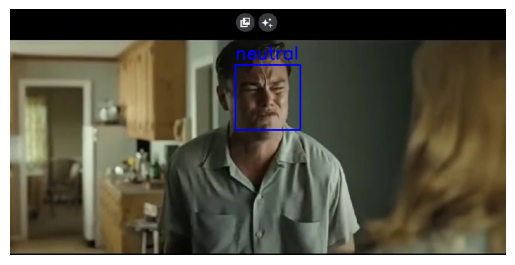

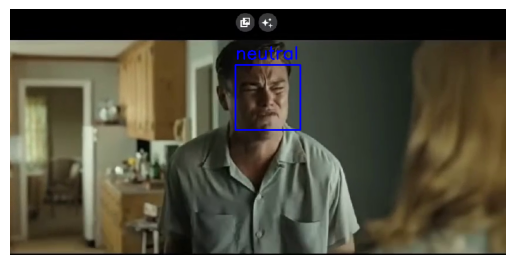

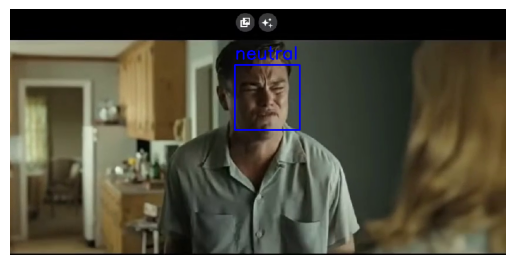

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


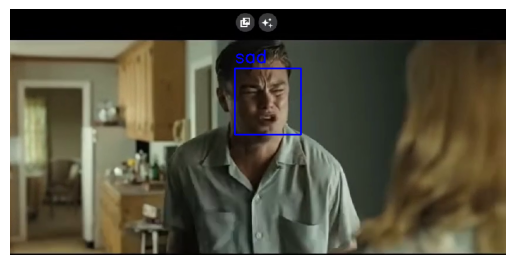

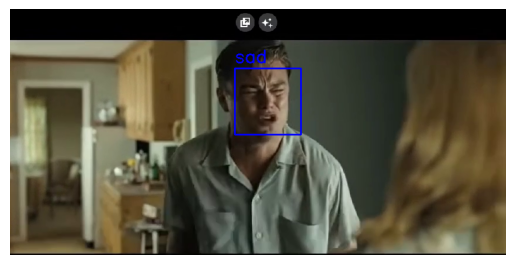

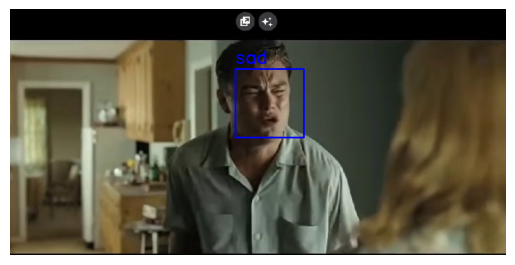

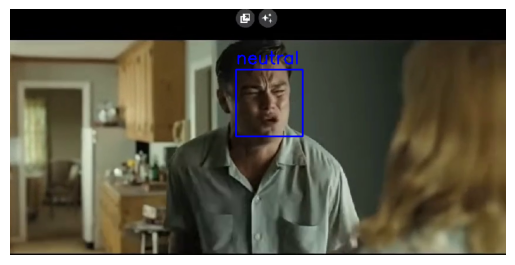

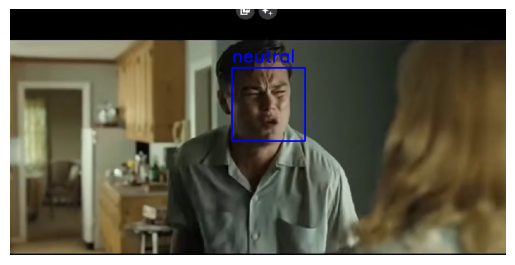

DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.
DeepFace error: Face could not be detected in numpy array.Please confirm that the picture is a face photo or consider to set enforce_detection param to False.


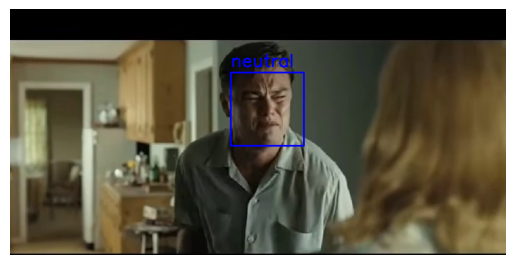

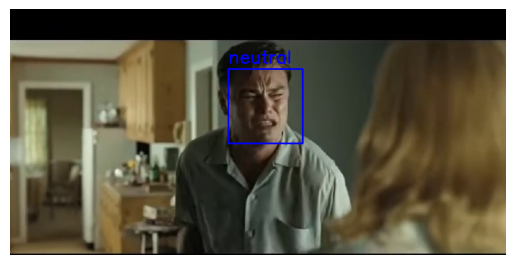

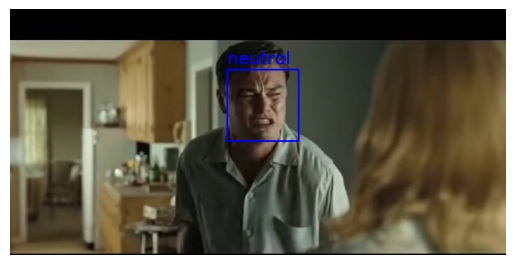

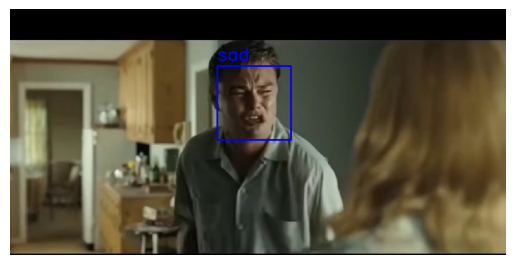

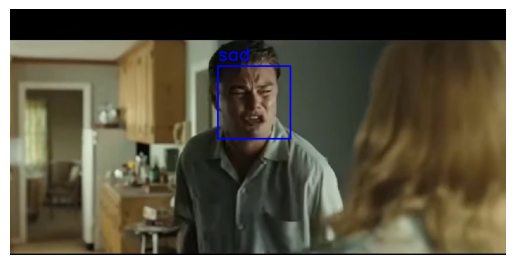

...

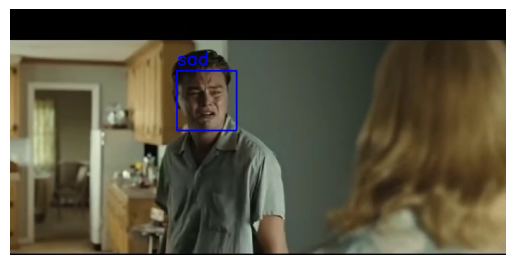

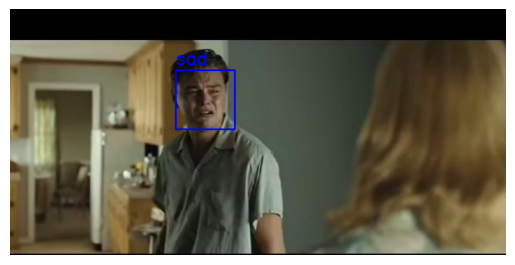

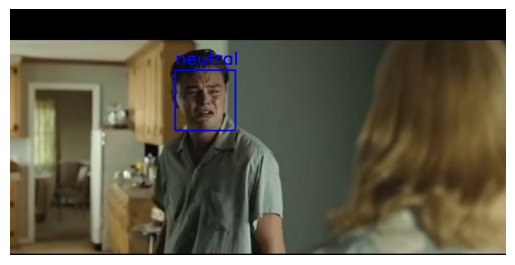

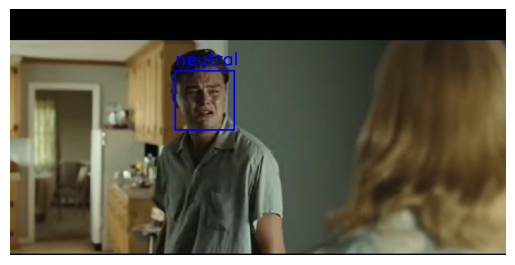

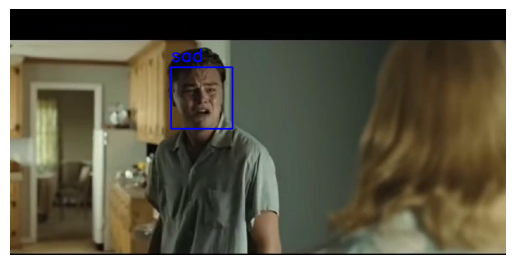

Reached the end of the video.


error: OpenCV(4.10.0) /io/opencv/modules/highgui/src/window.cpp:1295: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvDestroyAllWindows'


In [10]:
from typing import DefaultDict
from collections import defaultdict
from deepface import DeepFace
import cv2
import matplotlib.pyplot as plt

faceMark = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

video_path='/kaggle/input/emotion/emotion 1.mp4'

def facemark(frame, emotion):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  # Convert frame to grayscale
    faces = faceMark.detectMultiScale(gray, 1.1, 4)
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Draw rectangle around face
        cv2.putText(frame, emotion, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_4)  # Display emotion


    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

emotion=defaultdict(int)

cap = cv2.VideoCapture(video_path)

while cap.isOpened():
    ret, frame = cap.read()  # Capture frame-by-frame
    if not ret:
        print("Reached the end of the video.")
        break  # Exit loop if no more frames

    try:
        # Analyze emotions in the frame
        results = DeepFace.analyze(frame, actions=['emotion'])
        dominant_emotion = results[0]['dominant_emotion']
        emotion[dominant_emotion]+=1
        # Display emotion on the frame
        facemark(frame, dominant_emotion)
    except Exception as e:
        print(f"DeepFace error: {e}")
        continue

    # if cv2.waitKey(1) & 0xFF == ord('q'):
    #     break

cap.release()
cv2.destroyAllWindows()

In [11]:
print(emotion)

defaultdict(<class 'int'>, {'angry': 25, 'sad': 48, 'neutral': 18, 'fear': 2, 'happy': 1, 'surprise': 1})


# The most Occured Emotion Is SAD

In [1]:
!pip install --upgrade tensorflow==2.17.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 89.9 MB/s eta 0:00:00:00:01
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.17.0 which is incompatible.
tensorflow-text 2.16.1 requires tensorflow<2.17,>=2.16.1; platform_machine != "arm64" or platform_system != "Darwin", but you have tensorflow 2.17.0 which is incompatible.
tf-keras 2.16.0 

In [2]:
import numpy as np
import librosa
from tensorflow.keras.models import load_model
from scipy.io.wavfile import write
import tensorflow as tf
from IPython.display import Audio, display

2024-11-23 17:15:02.901833: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-23 17:15:02.925673: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-23 17:15:02.932705: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# loading Audio Model

In [3]:
# Load the model
model = load_model('/kaggle/input/emotion/audio_emotion_detection.h5')

# Parameters
sample_rate = 22050  # Sample rate for audio recording
duration = 3

I0000 00:00:1732382108.897187      30 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732382108.897625      30 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732382109.098355      30 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732382109.098729      30 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [4]:
def zcr(data, frame_length=2048, hop_length=512):
    zcr = librosa.feature.zero_crossing_rate(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(zcr)

# Root Mean Square Energy
def rmse(data, frame_length=2048, hop_length=512):
    rmse = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(rmse)

# Mel-Frequency Cepstral Coefficients
def mfcc(data, sr, n_fft=2048, hop_length=512, flatten=True):
    mfcc_feature = librosa.feature.mfcc(y=data, sr=sr, n_fft=n_fft, hop_length=hop_length)
    return np.squeeze(mfcc_feature.T) if not flatten else np.ravel(mfcc_feature.T)

def extract_features(audio, sr, frame_length=2048, hop_length=512):
    zcr_val = zcr(audio, frame_length=frame_length, hop_length=hop_length).mean()
    rmse_val = rmse(audio, frame_length=frame_length, hop_length=hop_length).mean()
    mfcc_val = mfcc(audio, sr=sr)
    features = np.hstack([zcr_val, rmse_val, mfcc_val])
    return features

def preprocess_features(features):
    # Assuming the model expects an input shape of (None, 2376, 1)
    # Zero pad or truncate to match expected input size of 2376
    padded_features = np.zeros(2376)
    padded_features[:min(2376, features.shape[0])] = features[:2376]
    padded_features = np.expand_dims(padded_features, axis=-1)  # Shape (2376, 1)
    return np.expand_dims(padded_features, axis=0)  # Shape (1, 2376, 1)

def predict_emotion(audio):
    # Extract features from audio
    features = extract_features(audio, sample_rate)
    # Preprocess features
    processed_features = preprocess_features(features)
    # Predict emotion
    prediction = model.predict(processed_features)
    emotion = np.argmax(prediction, axis=1)
    emotion_map = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Neutral', 5: 'Sad', 6: 'Surprise'}
    # print("Detected Emotion:", emotion_map.get(emotion[0], "Unknown"))
    return emotion_map.get(emotion[0], "Unknown")

# Extracting Audio From the Video

In [5]:
!ffmpeg -i "/kaggle/input/emotion/emotion 1.mp4" -q:a 0 -map a /kaggle/working/output_audio1.mp3

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [12]:
file_path='/kaggle/working/output_audio1.mp3'
audio, sr = librosa.load(file_path, sr=22050)
predict_emotion(audio)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sad


# predicted the Audio Emotion as Sad

# Inference : 

# Conclusion : 